In [1]:
import geopandas
import matplotlib.pyplot as plt
import pandas as pd
import contextily as cx
import folium
import textwrap
from adjustText import adjust_text

Import the crime figures datasets.

In [2]:
lsoa_2011_crime_figures_df = geopandas.read_file("lsoa_2011_sw5forces_crime_figures.gpkg")

In [3]:
lsoa_2011_crime_figures_df.head()

,LSOA11CD,LSOA11NM,LSOA11NMW,Area,sw_5forces_street_by_lsoa_Anti-social behaviour,sw_5forces_street_by_lsoa_Bicycle theft,sw_5forces_street_by_lsoa_Burglary,sw_5forces_street_by_lsoa_Criminal damage and arson,sw_5forces_street_by_lsoa_Drugs,sw_5forces_street_by_lsoa_Other crime,sw_5forces_street_by_lsoa_Other theft,sw_5forces_street_by_lsoa_Possession of weapons,sw_5forces_street_by_lsoa_Public order,sw_5forces_street_by_lsoa_Robbery,sw_5forces_street_by_lsoa_Shoplifting,sw_5forces_street_by_lsoa_Theft from the person,sw_5forces_street_by_lsoa_Vehicle crime,sw_5forces_street_by_lsoa_Violence and sexual offences,sw_5forces_street_by_lsoa_Total number crimes,geometry
0,E01014370,Bath and North East Somerset 007A,Bath and North East Somerset 007A,374339,1476,75,172,181,45,21,445,12,541,34,975,107,34,917,5035,"MULTIPOLYGON (((375207.458 165659.881, 375312...."
1,E01014371,Bath and North East Somerset 007B,Bath and North East Somerset 007B,410758,742,69,57,85,19,18,176,8,288,14,314,44,22,455,2311,"MULTIPOLYGON (((375613.903 165217.218, 375635...."
2,E01014372,Bath and North East Somerset 007C,Bath and North East Somerset 007C,164486,270,15,60,68,13,7,98,1,129,12,8,15,14,330,1040,"MULTIPOLYGON (((375273.457 165743.254, 375335...."
3,E01014373,Bath and North East Somerset 010A,Bath and North East Somerset 010A,1060797,57,3,15,27,3,1,8,0,24,1,1,1,15,55,211,"MULTIPOLYGON (((377835.224 168339.576, 377910...."
4,E01014374,Bath and North East Somerset 010B,Bath and North East Somerset 010B,4972916,28,0,21,10,1,1,10,0,8,0,0,0,5,24,108,"MULTIPOLYGON (((378721.671 167591.617, 378472...."


In [4]:
type(lsoa_2011_crime_figures_df)

geopandas.geodataframe.GeoDataFrame

<Axes: >

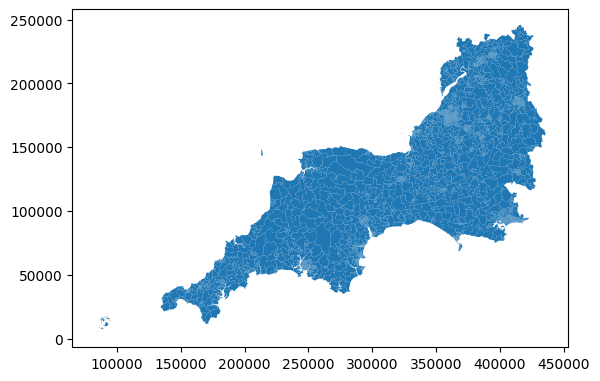

In [5]:
lsoa_2011_crime_figures_df.plot()

<Axes: >

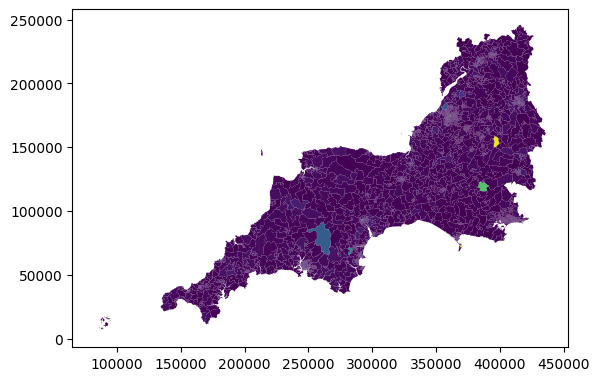

In [6]:
lsoa_2011_crime_figures_df.plot(column="sw_5forces_street_by_lsoa_Other crime")

In [7]:
sw_5forces_stop_and_search_df = pd.read_csv("sw_5forces_stop_and_search.csv")

In [8]:
sw_5forces_stop_and_search_df.head(1)

,Type,Date,Part of a policing operation,Policing operation,Latitude,Longitude,Gender,Age range,Self-defined ethnicity,Officer-defined ethnicity,Legislation,Object of search,Outcome,Outcome linked to object of search,Removal of more than just outer clothing,Unnamed: 15
0,Person search,2019-06-01T00:02:00+00:00,NaN,NaN,51.496817,-2.580971,Male,25-34,White - English/Welsh/Scottish/Northern Irish/...,White,Police and Criminal Evidence Act 1984 (section 1),Articles for use in criminal damage,Arrest,False,False,NaN


In [9]:
type(sw_5forces_stop_and_search_df)

pandas.core.frame.DataFrame

In [10]:
sw_5forces_stop_and_search_gdf = geopandas.GeoDataFrame(
    sw_5forces_stop_and_search_df, # Our pandas dataframe
    geometry = geopandas.points_from_xy(
        sw_5forces_stop_and_search_df['Longitude'], # Our 'x' column (horizontal position of points)
        sw_5forces_stop_and_search_df['Latitude'] # Our 'y' column (vertical position of points)
        ),
    crs = 'EPSG:4326' # the coordinate reference system of the data - use EPSG:4326 if you are unsure
    )

In [11]:
# sw_5forces_stop_and_search_gdf = geopandas.GeoDataFrame(
#     sw_5forces_stop_and_search_df, # Our pandas dataframe
#     geometry = geopandas.points_from_xy(
#         sw_5forces_stop_and_search_df['Longitude'], # Our 'x' column (horizontal position of points)
#         sw_5forces_stop_and_search_df['Latitude'] # Our 'y' column (vertical position of points)
#         ),
#     crs = 'EPSG:27700' # THIS IS THE LINE WE'VE CHANGED
#     )

In [12]:
# my_gdf = geopandas.GeoDataFrame(
#     my_df, # Our pandas dataframe
#     geometry = geopandas.points_from_xy(
#         my_df['Eastings'], # Our 'x' column (horizontal position of points)
#         my_df['Northings'] # Our 'y' column (vertical position of points)
#         ),
#     crs = 'EPSG:27700' # British National Grid
# )

In [13]:
type(sw_5forces_stop_and_search_gdf)

geopandas.geodataframe.GeoDataFrame

<Axes: >

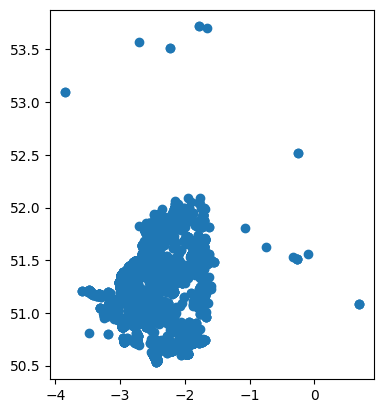

In [14]:
sw_5forces_stop_and_search_gdf.plot()

<Axes: >

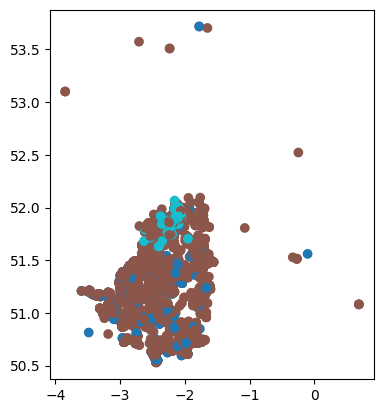

In [15]:
sw_5forces_stop_and_search_gdf.plot("Gender")

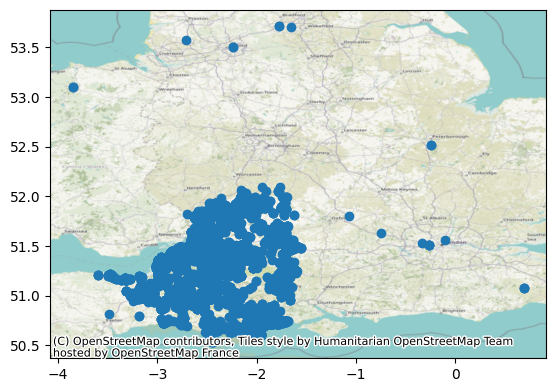

In [16]:
ax = sw_5forces_stop_and_search_gdf.plot()

cx.add_basemap(
    ax, # the figure we created using our plot method
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(), # we can pull the CRS out of the geodataframe!
    zoom=8 # zoom level
    )

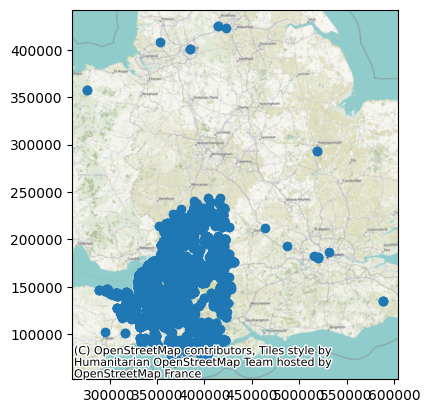

In [17]:
sw_5forces_stop_and_search_gdf = sw_5forces_stop_and_search_gdf.to_crs("EPSG:27700")

ax = sw_5forces_stop_and_search_gdf.plot()

cx.add_basemap(
    ax, # the figure we created using our plot method
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(), # we can pull the CRS out of the geodataframe!
    zoom=8 # zoom level
    )

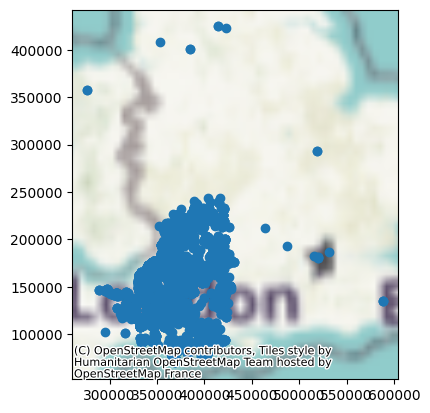

In [18]:
ax = sw_5forces_stop_and_search_gdf.plot()

cx.add_basemap(
    ax,
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(),
    zoom=4 # zoom level
    )

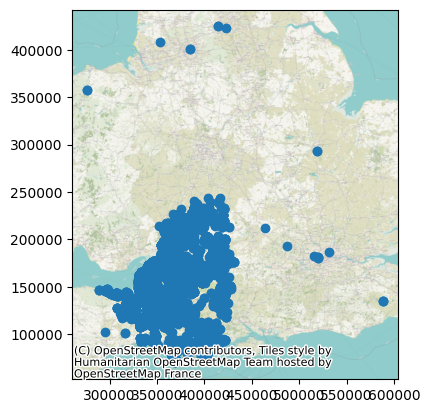

In [19]:
# ax = sw_5forces_stop_and_search_gdf.plot()

# cx.add_basemap(
#     ax,
#     crs=sw_5forces_stop_and_search_gdf.crs.to_string(),
#     zoom=10 # zoom level
#     )

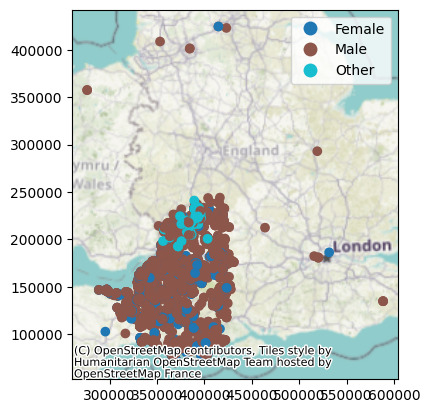

In [20]:
ax = sw_5forces_stop_and_search_gdf.plot(column="Gender", legend=True)

cx.add_basemap(
    ax,
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(),
    zoom=6
    )

(260632.38289470828, 604153.6141031217, 52383.152460906495, 442416.8273138181)

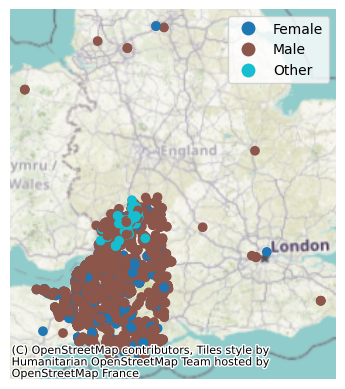

In [21]:
ax = sw_5forces_stop_and_search_gdf.plot(column="Gender", legend=True)

cx.add_basemap(
    ax,
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(),
    zoom=6
    )

# Turn off the numbers and axis tick marks around the edge of the map
ax.axis('off')

(260632.38289470828, 604153.6141031217, 52383.152460906495, 442416.8273138181)

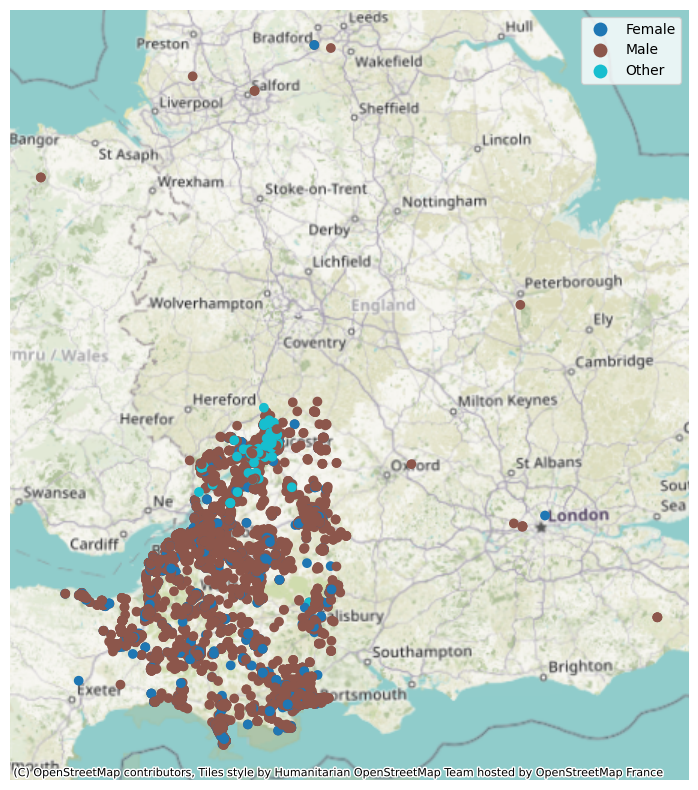

In [22]:
ax = sw_5forces_stop_and_search_gdf.plot(
    column="Gender",
    legend=True,
    figsize=(10, 10)
    )

cx.add_basemap(
    ax,
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(),
    zoom=7
    )

# Turn off the numbers and axis tick marks around the edge of the map
ax.axis('off')

(260632.38289470828, 604153.6141031217, 52383.152460906495, 442416.8273138181)

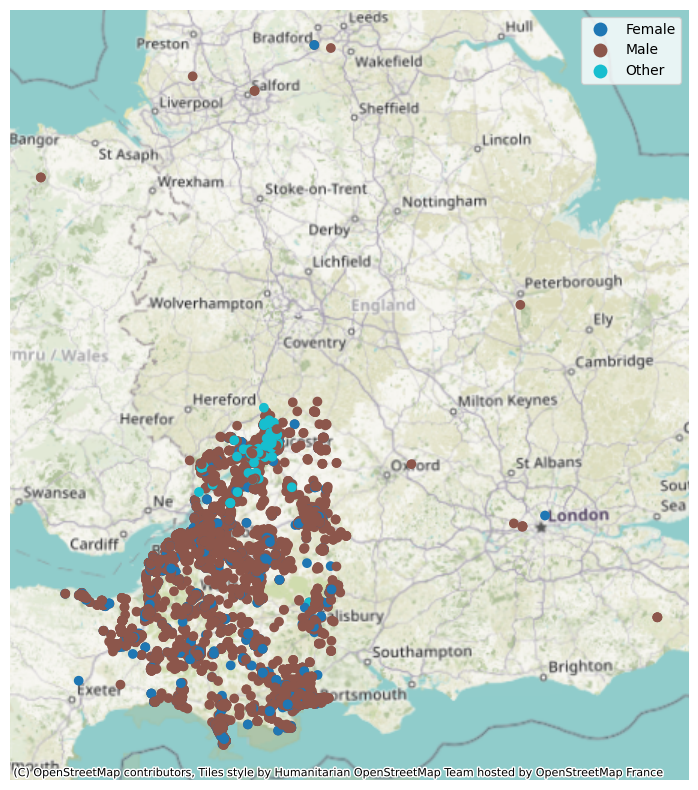

In [23]:
ax = sw_5forces_stop_and_search_gdf.plot(
    column="Gender",
    legend=True,
    figsize=(10, 10)
    )

cx.add_basemap(
    ax,
    crs=sw_5forces_stop_and_search_gdf.crs.to_string(),
    zoom=7
    )

# Turn off the numbers and axis tick marks around the edge of the map
ax.axis('off')

In [24]:
lsoa_2011_crime_figures_df.head(1)

,LSOA11CD,LSOA11NM,LSOA11NMW,Area,sw_5forces_street_by_lsoa_Anti-social behaviour,sw_5forces_street_by_lsoa_Bicycle theft,sw_5forces_street_by_lsoa_Burglary,sw_5forces_street_by_lsoa_Criminal damage and arson,sw_5forces_street_by_lsoa_Drugs,sw_5forces_street_by_lsoa_Other crime,sw_5forces_street_by_lsoa_Other theft,sw_5forces_street_by_lsoa_Possession of weapons,sw_5forces_street_by_lsoa_Public order,sw_5forces_street_by_lsoa_Robbery,sw_5forces_street_by_lsoa_Shoplifting,sw_5forces_street_by_lsoa_Theft from the person,sw_5forces_street_by_lsoa_Vehicle crime,sw_5forces_street_by_lsoa_Violence and sexual offences,sw_5forces_street_by_lsoa_Total number crimes,geometry
0,E01014370,Bath and North East Somerset 007A,Bath and North East Somerset 007A,374339,1476,75,172,181,45,21,445,12,541,34,975,107,34,917,5035,"MULTIPOLYGON (((375207.458 165659.881, 375312...."


(85000.0, 100000.0)

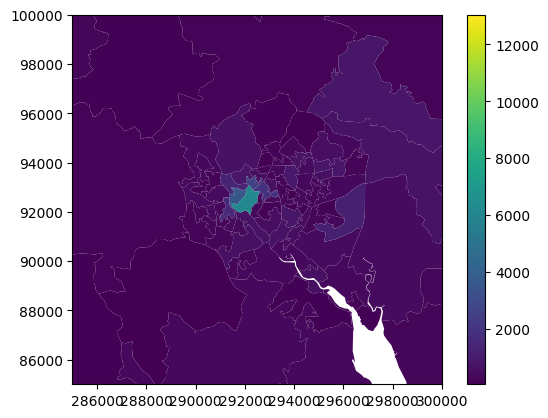

In [25]:
ax = lsoa_2011_crime_figures_df.plot(
    column="sw_5forces_street_by_lsoa_Total number crimes",
    legend=True
    )

ax.set_xlim(285000,300000)
ax.set_ylim(85000,100000)

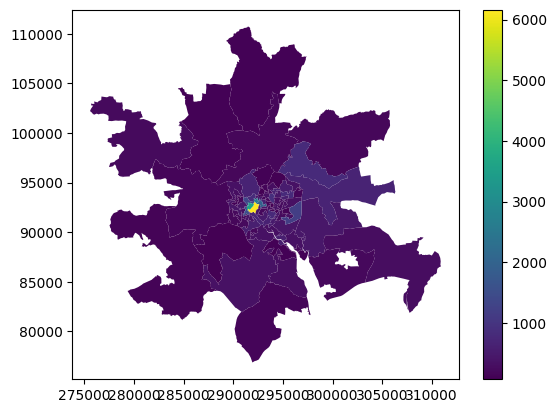

In [26]:
xmin, xmax = 285000,300000
ymin, ymax = 85000,100000
lsoa_2011_crime_figures_df_exeter = lsoa_2011_crime_figures_df.cx[xmin:xmax, ymin:ymax]

ax = lsoa_2011_crime_figures_df_exeter.plot(
    column="sw_5forces_street_by_lsoa_Total number crimes",
    legend=True
    )

(288890.8320499536, 297274.4809500022, 89238.48039968988, 97217.69560001476)

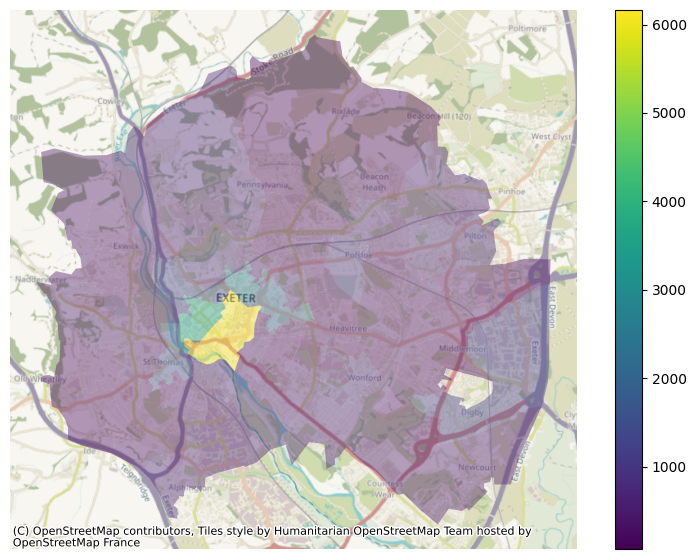

In [27]:
xmin, xmax = 290000,295000
ymin, ymax = 91000,95000
lsoa_2011_crime_figures_df_exeter = lsoa_2011_crime_figures_df.cx[xmin:xmax, ymin:ymax]

ax = lsoa_2011_crime_figures_df_exeter.plot(
    column="sw_5forces_street_by_lsoa_Total number crimes",
    legend=True,
    figsize=(10,7),
    alpha=0.4 # Add this - max is 1, values closer to 0 are more transparent
    )

cx.add_basemap(
    ax,
    crs=lsoa_2011_crime_figures_df_exeter.crs.to_string(),
    zoom=13
    )

ax.axis('off')

<Axes: >

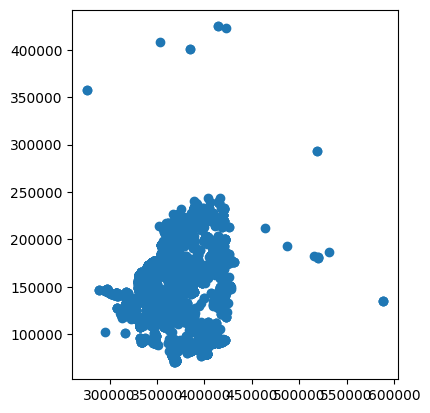

In [28]:
sw_5forces_stop_and_search_gdf.plot()

(298650.7467424413, 352424.2217003847, 98242.32626640686, 152376.66826406066)

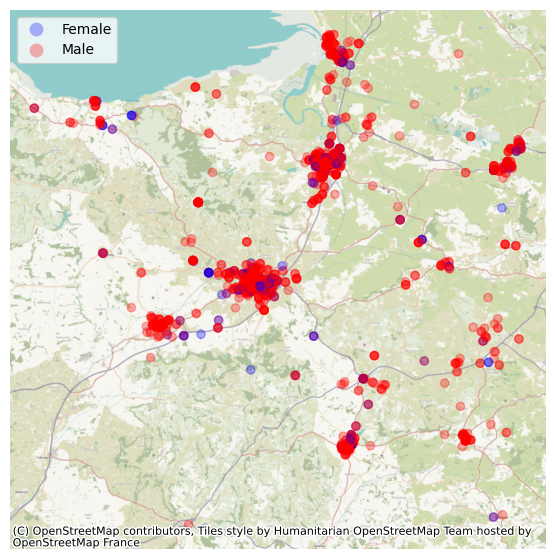

In [29]:
xmin, xmax = 300000,350000
ymin, ymax = 100000,150000
sw_5forces_stop_and_search_gdf_subset = sw_5forces_stop_and_search_gdf.cx[xmin:xmax, ymin:ymax]

ax = sw_5forces_stop_and_search_gdf_subset.plot(
    column="Gender",
    legend=True,
    figsize=(10, 7),
    cmap="bwr", # Set a colourmap here
    alpha=0.3
    )

cx.add_basemap(
    ax,
    crs=sw_5forces_stop_and_search_gdf_subset.crs.to_string(),
    zoom=12
    )

ax.axis('off')

(288890.8320499536, 297274.4809500022, 89238.48039968988, 97217.69560001476)

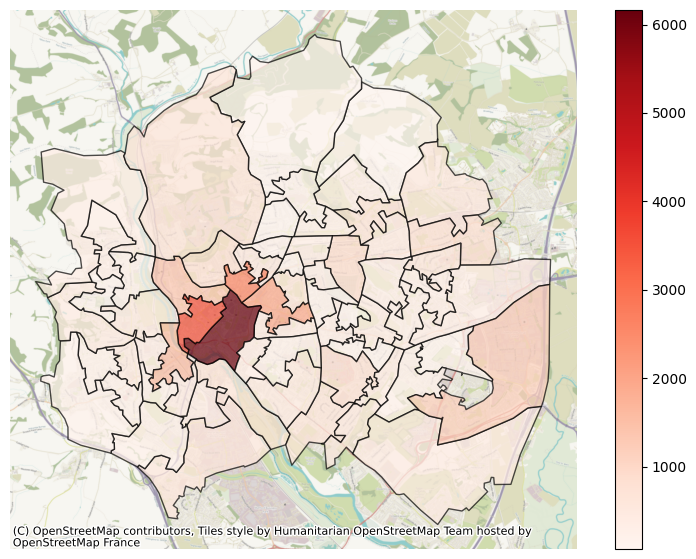

In [30]:
xmin, xmax = 290000,295000
ymin, ymax = 91000,95000
lsoa_2011_crime_figures_df_exeter = lsoa_2011_crime_figures_df.cx[xmin:xmax, ymin:ymax]

ax = lsoa_2011_crime_figures_df_exeter.plot(
    column="sw_5forces_street_by_lsoa_Total number crimes",
    legend=True,
    figsize=(10,7),
    edgecolor='black', # Let's add an edgecolour while we're at it!
    cmap="Reds",
    alpha=0.7
    )

cx.add_basemap(
    ax,
    crs=lsoa_2011_crime_figures_df_exeter.crs.to_string(),
    zoom=15
    )

ax.axis('off')

In [31]:
gp_list = pd.read_csv("gp_surgery_locations_plus_patient_list_size.csv")

In [32]:
gp_list.head()

,Unnamed: 0,gp_code,name,address_1,postcode,valid_from,valid_to,query,result_postcode,result_quality,...,Female 75+,Male 00-04,Male 05-14,Male 15-24,Male 25-34,Male 35-44,Male 45-54,Male 55-64,Male 65-74,Male 75+
0,0,A81001,THE DENSHAM SURGERY,THE HEALTH CENTRE,TS18 1HU,19740401,NaN,TS18 1HU,TS18 1HU,1.0,...,250.0,89.0,230.0,230.0,232.0,258.0,244.0,227.0,230.0,201.0
1,1,A81002,QUEENS PARK MEDICAL CENTRE,QUEENS PARK MEDICAL CTR,TS18 2AW,19740401,NaN,TS18 2AW,TS18 2AW,1.0,...,1153.0,390.0,1004.0,963.0,1183.0,1180.0,1037.0,1465.0,1059.0,863.0
2,2,A81004,ACKLAM MEDICAL CENTRE,TRIMDON AVENUE,TS5 8SB,19740401,NaN,TS5 8SB,TS5 8SB,1.0,...,618.0,329.0,676.0,595.0,896.0,899.0,683.0,693.0,571.0,470.0
3,3,A81005,SPRINGWOOD SURGERY,SPRINGWOOD SURGERY,TS14 7DJ,19740401,NaN,TS14 7DJ,TS14 7DJ,1.0,...,686.0,125.0,419.0,382.0,360.0,417.0,490.0,550.0,545.0,573.0
4,4,A81006,TENNANT STREET MEDICAL PRACTICE,TENNANT ST MEDICAL PRACT,TS18 2AT,19740401,NaN,TS18 2AT,TS18 2AT,1.0,...,755.0,337.0,939.0,822.0,913.0,938.0,880.0,995.0,764.0,558.0


In [33]:
gp_list_gdf = geopandas.GeoDataFrame(
    gp_list, # Our pandas dataframe
    geometry = geopandas.points_from_xy(
        gp_list['result_eastings'], # Our 'x' column (horizontal position of points)
        gp_list['result_northings'] # Our 'y' column (vertical position of points)
        ),
    crs = 'EPSG:27700'
    )

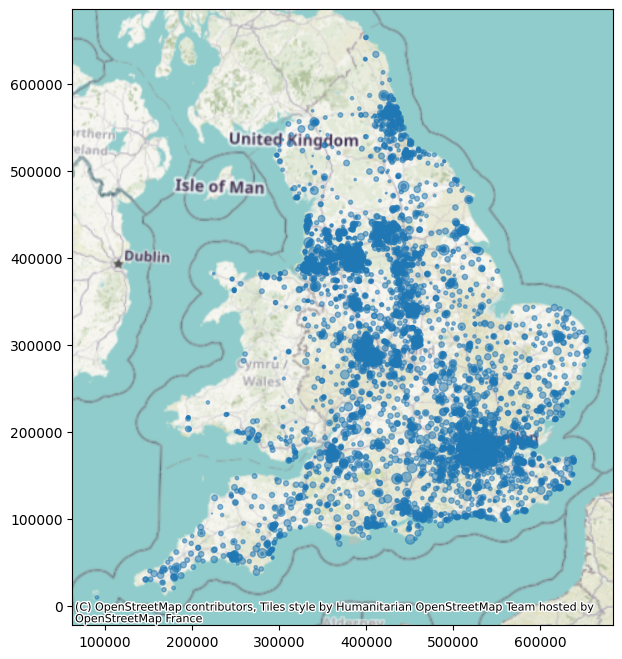

In [34]:
ax = gp_list_gdf.plot(
    figsize=(11, 8),
    markersize=gp_list_gdf['Total List Size']/1000,
    alpha=0.5
    )

cx.add_basemap(
    ax,
    crs=gp_list_gdf.crs.to_string(),
    zoom=6
    )


(77832.45, 362546.55, 3326.8999999999996, 156339.1)

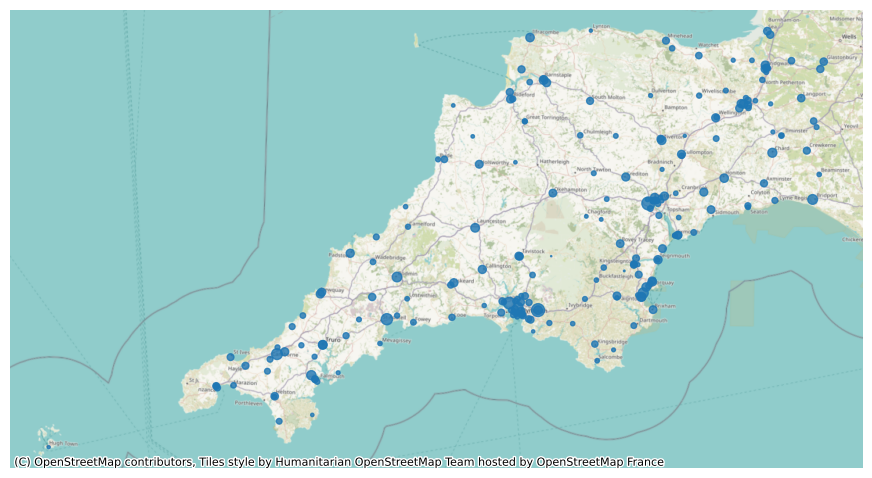

In [35]:
xmin, xmax = 80000,350000
ymin, ymax = 0,150000
gp_list_gdf_exeter = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

ax = gp_list_gdf_exeter.plot(
    figsize=(11, 8),
    markersize=gp_list_gdf_exeter['Total List Size']/500,
    alpha=0.8
    )

cx.add_basemap(
    ax,
    crs=gp_list_gdf_exeter.crs.to_string(),
    zoom=9
    )

ax.axis('off')

In [36]:
(gp_list_gdf_exeter['Total List Size']/500).tolist()

[nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 10.192,
 49.042,
 17.796,
 39.078,
 17.44,
 15.798,
 43.248,
 13.256,
 21.434,
 nan,
 47.654,
 11.708,
 33.806,
 15.61,
 13.298,
 33.626,
 4.896,
 28.504,
 19.734,
 33.704,
 9.7,
 13.37,
 35.674,
 32.182,
 37.834,
 16.442,
 24.614,
 23.752,
 10.354,
 60.764,
 33.032,
 9.134,
 17.542,
 18.96,
 24.608,
 15.154,
 7.718,
 19.912,
 19.662,
 26.53,
 21.47,
 17.902,
 16.74,
 5.914,
 9.494,
 11.352,
 12.166,
 13.76,
 16.984,
 13.126,
 nan,
 12.39,
 14.588,
 35.892,
 19.336,
 23.012,
 30.17,
 69.934,
 17.93,
 38.718,
 14.33,
 16.668,
 6.172,
 31.97,
 42.394,
 15.414,
 85.678,
 21.79,
 19.62,
 25.332,
 20.14,
 11.154,
 16.644,
 14.682,
 10.292,
 16.108,
 22.706,
 16.454,
 18.724,
 23.91,
 20.262,
 32.778,
 27.388,
 11.5,
 34.29,
 18.446,
 19.186,
 29.832,
 16.378,
 29.796,
 19.35,
 22.6,
 6.736,
 25.866,
 20.49,
 26.852,
 24.768,
 11.342,
 30.272,
 30.358,
 15.398,
 16.392,
 20.374,

(77832.45, 362546.55, 3326.8999999999996, 156339.1)

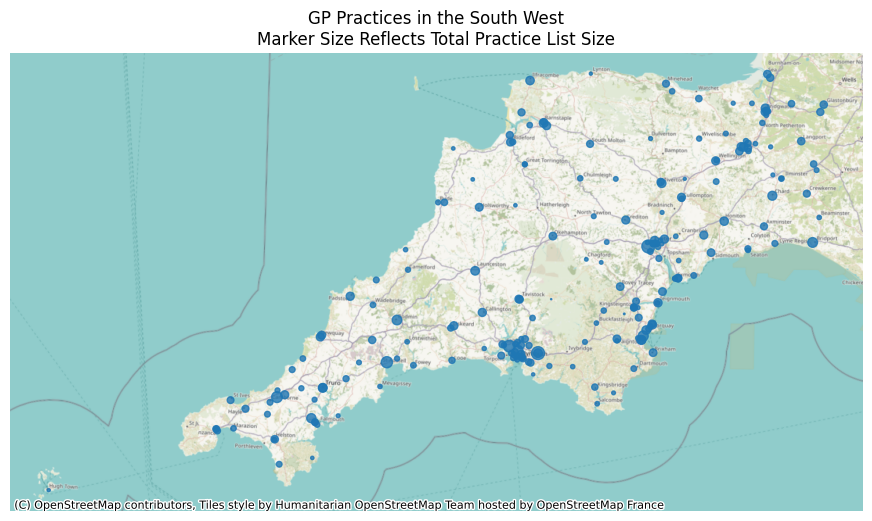

In [37]:
xmin, xmax = 80000,350000
ymin, ymax = 0,150000
gp_list_gdf_sw = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

ax = gp_list_gdf_sw.plot(
    figsize=(11, 8),
    markersize=gp_list_gdf_sw['Total List Size']/500,
    alpha=0.8
    )

cx.add_basemap(
    ax,
    crs=gp_list_gdf_sw.crs.to_string(),
    zoom=9
    )

# Add a title to our map
plt.title("GP Practices in the South West\nMarker Size Reflects Total Practice List Size")

ax.axis('off')

Text(0.5, 1.0, 'GP Practices in Torbay')

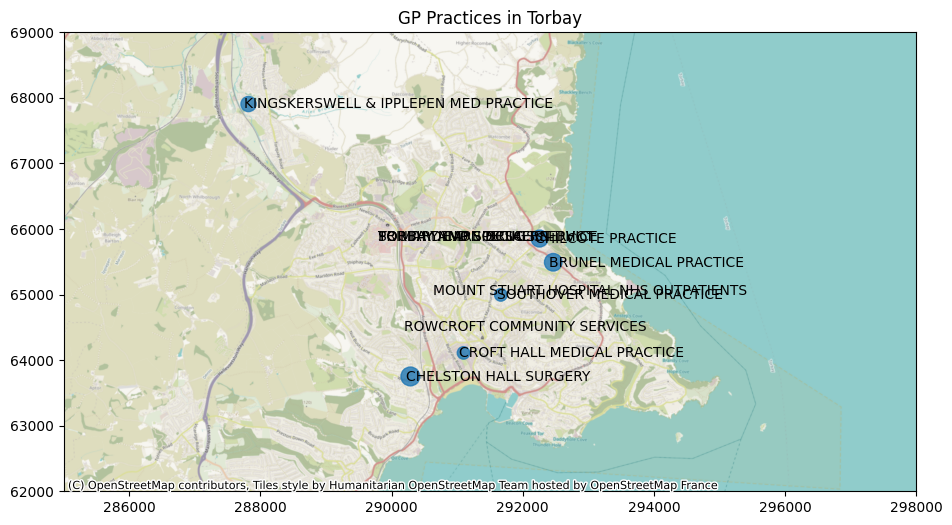

In [38]:
xmin, xmax = 285000,298000
ymin, ymax = 62000,69000
gp_list_gdf_torbay = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

ax = gp_list_gdf_torbay.plot(
    figsize=(11, 8),
    markersize=gp_list_gdf_torbay['Total List Size']/100,
    alpha=0.8
    )

for x, y, label in zip(gp_list_gdf_torbay.geometry.x, gp_list_gdf_torbay.geometry.y, gp_list_gdf_torbay.name):
    ax.annotate(label, xy=(x, y), xytext=(-3, -3), textcoords="offset points")

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

cx.add_basemap(
    ax,
    crs=gp_list_gdf_torbay.crs.to_string(),
    zoom=14
    )

plt.title("GP Practices in Torbay")

Text(0.5, 1.0, 'GP Practices in Torbay')

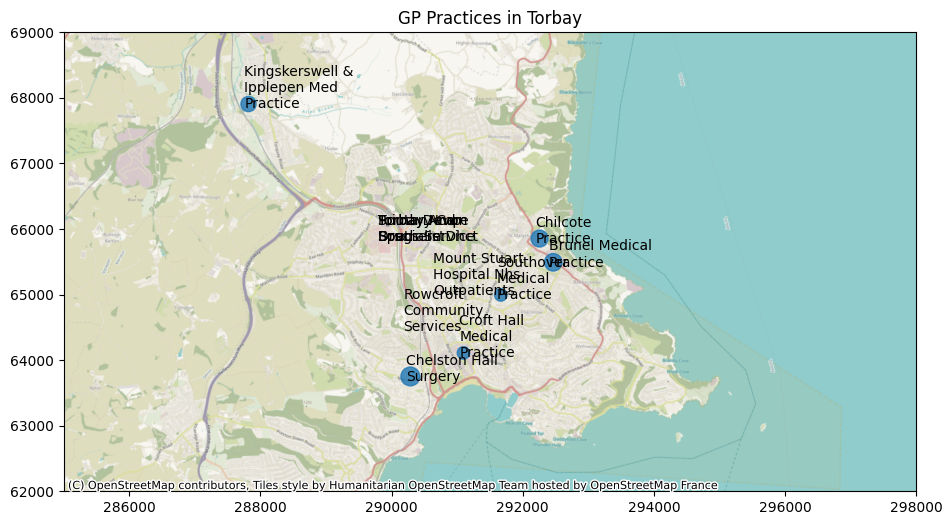

In [39]:
xmin, xmax = 285000,298000
ymin, ymax = 62000,69000
gp_list_gdf_torbay = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

ax = gp_list_gdf_torbay.plot(
    figsize=(11, 8),
    markersize=gp_list_gdf_torbay['Total List Size']/100,
    alpha=0.8
    )

for x, y, label in zip(gp_list_gdf_torbay.geometry.x, gp_list_gdf_torbay.geometry.y, gp_list_gdf_torbay.name):
    wrapped_label = textwrap.fill(label,15).title()
    ax.annotate(wrapped_label, xy=(x, y), xytext=(-3, -3), textcoords="offset points")

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

cx.add_basemap(
    ax,
    crs=gp_list_gdf_torbay.crs.to_string(),
    zoom=14
    )

plt.title("GP Practices in Torbay")

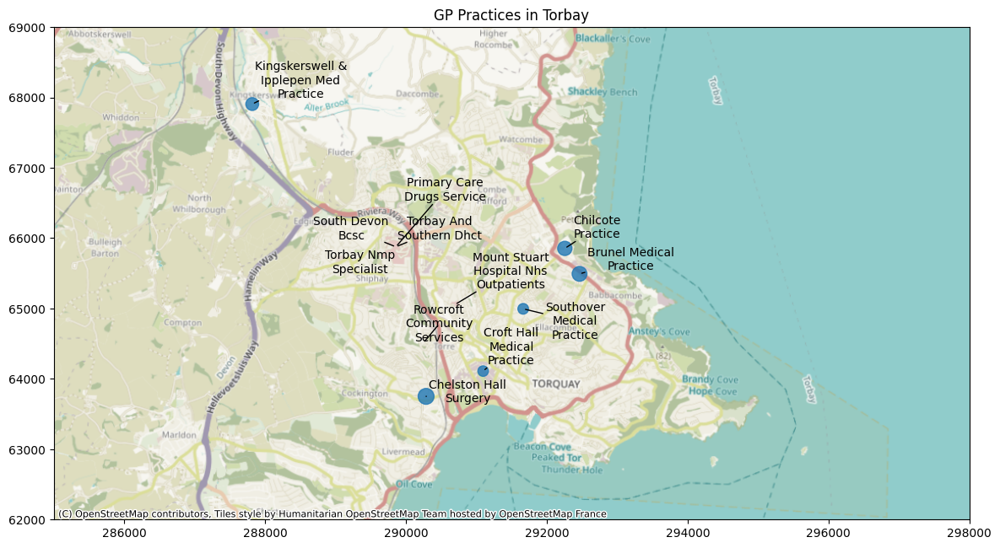

In [40]:
xmin, xmax = 285000,298000
ymin, ymax = 62000,69000
gp_list_gdf_torbay = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

ax = gp_list_gdf_torbay.plot(
    figsize=(14, 9),
    markersize=gp_list_gdf_torbay['Total List Size']/100,
    alpha=0.8
    )

texts = []

for x, y, label in zip(gp_list_gdf_torbay.geometry.x, gp_list_gdf_torbay.geometry.y, gp_list_gdf_torbay.name):
    wrapped_label = textwrap.fill(label,15).title()
    texts.append(plt.text(x, y, wrapped_label))

# Add a title to our map
plt.title("GP Practices in Torbay")

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

cx.add_basemap(
    ax,
    crs=gp_list_gdf_torbay.crs.to_string(),
    zoom=13
    )

adjust_text(
    texts,
    force_explode=(0.05,0.05),
    arrowprops=dict(arrowstyle="-", color='k', lw=1),
    time_lim=5
    )


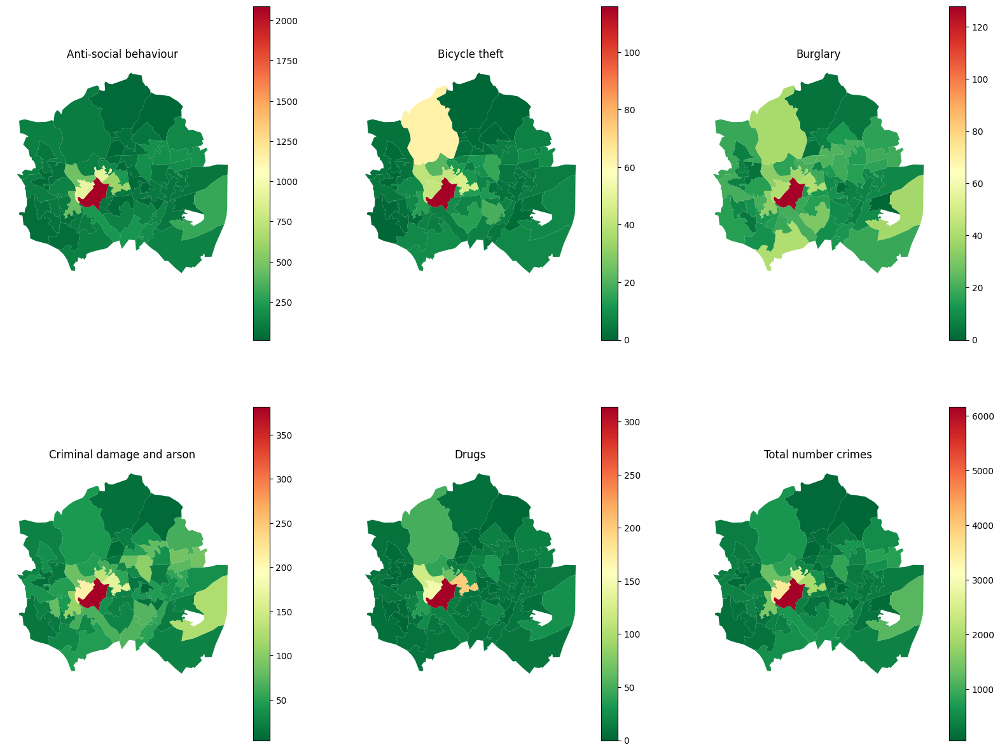

In [41]:
xmin, xmax = 290000,295000
ymin, ymax = 91000,95000
lsoa_2011_crime_figures_df_exeter = lsoa_2011_crime_figures_df.cx[xmin:xmax, ymin:ymax]

lsoa_2011_crime_figures_df_exeter = lsoa_2011_crime_figures_df_exeter.rename(columns=
    {
        'sw_5forces_street_by_lsoa_Anti-social behaviour': 'Anti-social behaviour',
        'sw_5forces_street_by_lsoa_Bicycle theft': 'Bicycle theft',
        'sw_5forces_street_by_lsoa_Burglary': 'Burglary',
        'sw_5forces_street_by_lsoa_Criminal damage and arson': 'Criminal damage and arson',
        'sw_5forces_street_by_lsoa_Drugs': 'Drugs',
        'sw_5forces_street_by_lsoa_Total number crimes': 'Total number crimes'
    }
)

cols = ['Anti-social behaviour', 'Bicycle theft', 'Burglary', 'Criminal damage and arson',
        'Drugs', 'Total number crimes']

fig, axs = plt.subplots(2, 3, figsize=(20, 15))

for i, ax in enumerate(fig.axes):
    lsoa_2011_crime_figures_df_exeter.plot(cols[i], cmap="RdYlGn_r", legend=True, ax=ax)

    ax.axis('off')

    ax.title.set_text(cols[i])

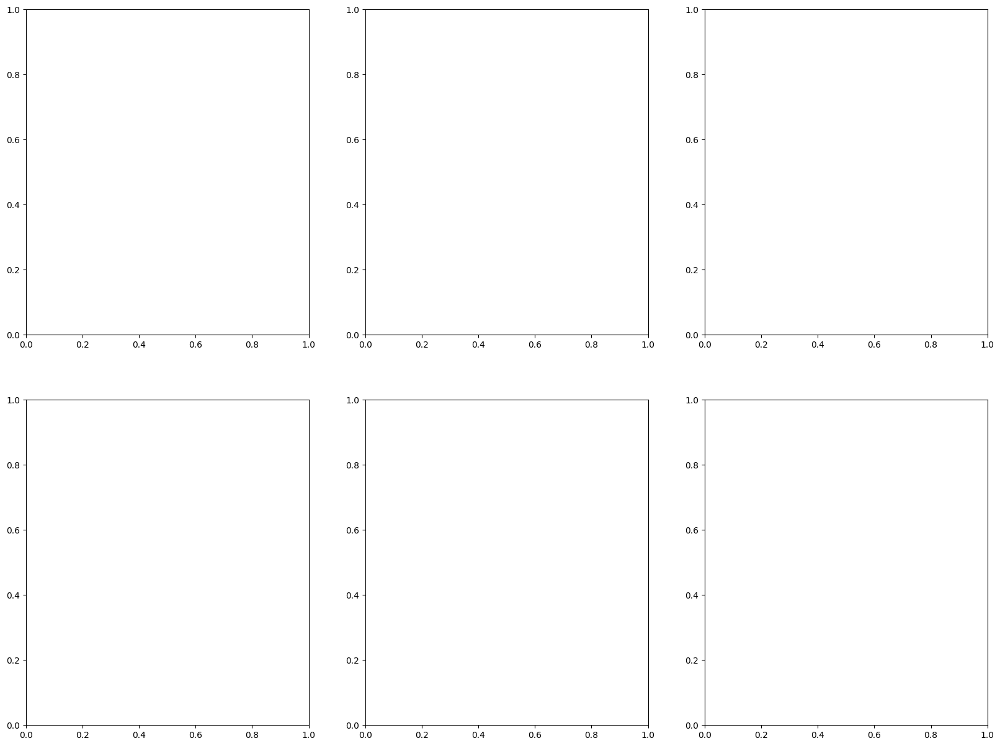

In [42]:
fig, axs = plt.subplots(2, 3, figsize=(20, 15))

(25000.0, 200000.0)

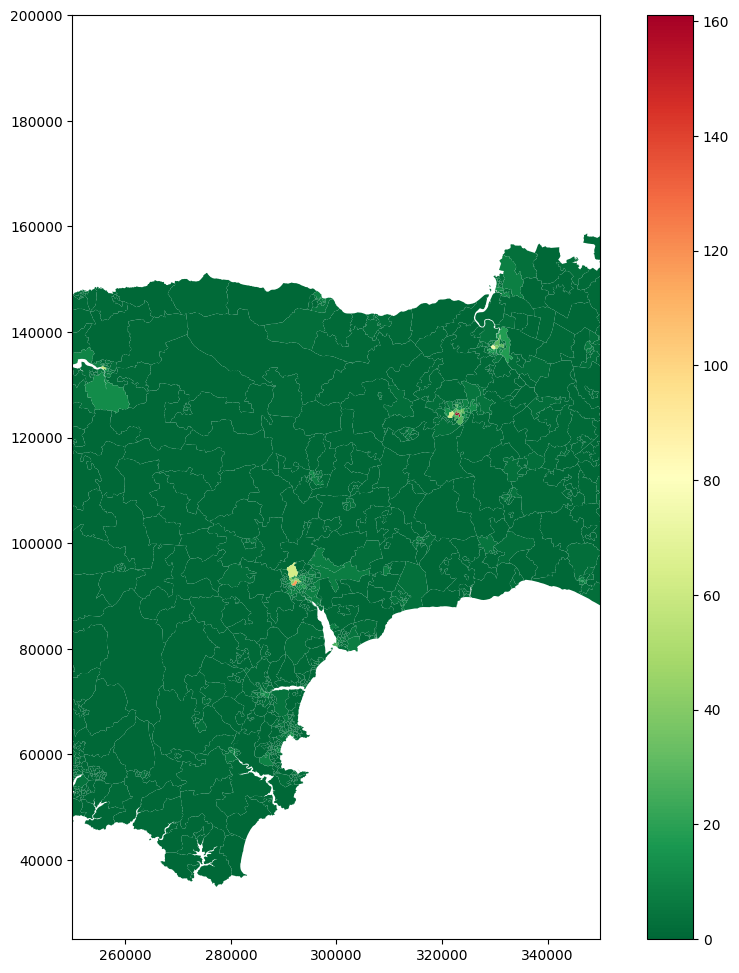

In [43]:
fig, ax1 = plt.subplots(figsize=(12,12))

lsoa_2011_crime_figures_df_devon=lsoa_2011_crime_figures_df.cx[250000:350000, 0:150000]

ax1 = lsoa_2011_crime_figures_df_devon.plot(
    column='sw_5forces_street_by_lsoa_Bicycle theft',
    cmap="RdYlGn_r",
    legend=True,
    ax=ax1
    )

ax1.set_xlim(250000, 350000)
ax1.set_ylim(25000, 200000)

Text(0.5, 1.0, 'Bike Theft in Devon')

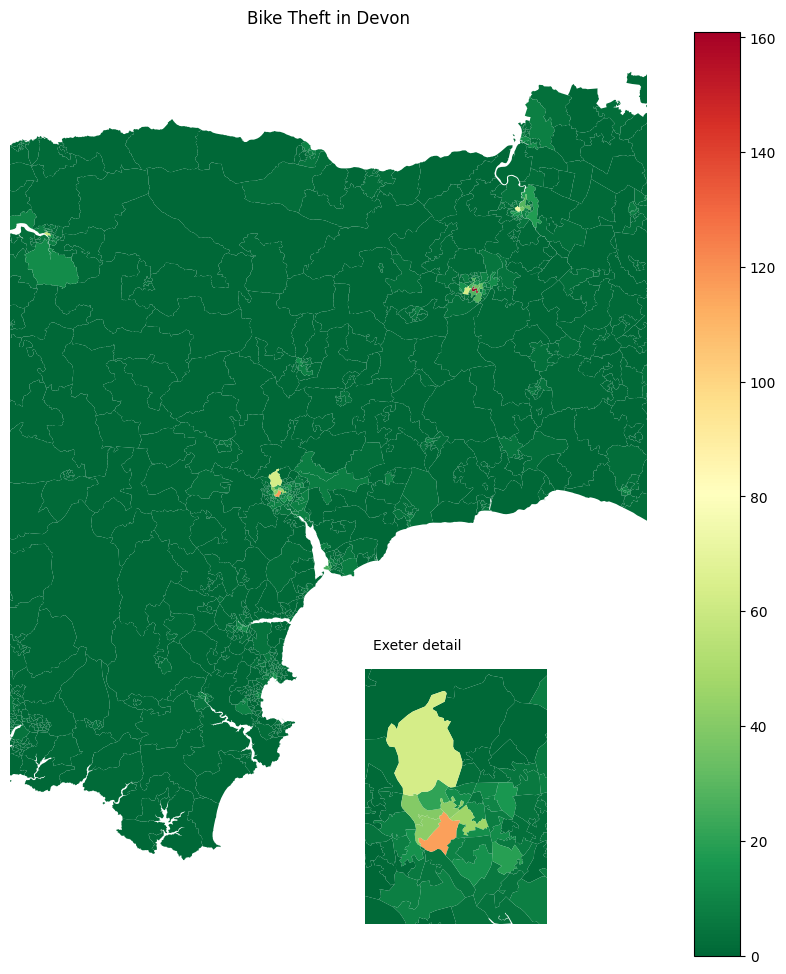

In [44]:
fig, ax1 = plt.subplots(figsize=(12,12))

lsoa_2011_crime_figures_df_devon=lsoa_2011_crime_figures_df.cx[250000:350000, 0:150000]

ax1 = lsoa_2011_crime_figures_df_devon.plot(
    column='sw_5forces_street_by_lsoa_Bicycle theft',
    cmap="RdYlGn_r",
    legend=True,
    ax=ax1
    )

ax1.set_xlim(250000, 350000)
ax1.set_ylim(20000, 165000)

ax2 = ax1.inset_axes([305000,25000,30000,40000],
                     transform=ax1.transData,
                     xlim=(290000,295000),
                     ylim=(90000,97000)
                     )

ax2 = lsoa_2011_crime_figures_df_devon.plot(
    column='sw_5forces_street_by_lsoa_Bicycle theft',
    cmap="RdYlGn_r",
    legend=False,
    ax=ax2
    )

ax1.text(307000,68000,'Exeter detail', fontsize='medium')
ax1.axis('off')
ax2.axis('off')

plt.title("Bike Theft in Devon")

Text(0.5, 1.0, 'Bike Theft in Devon')

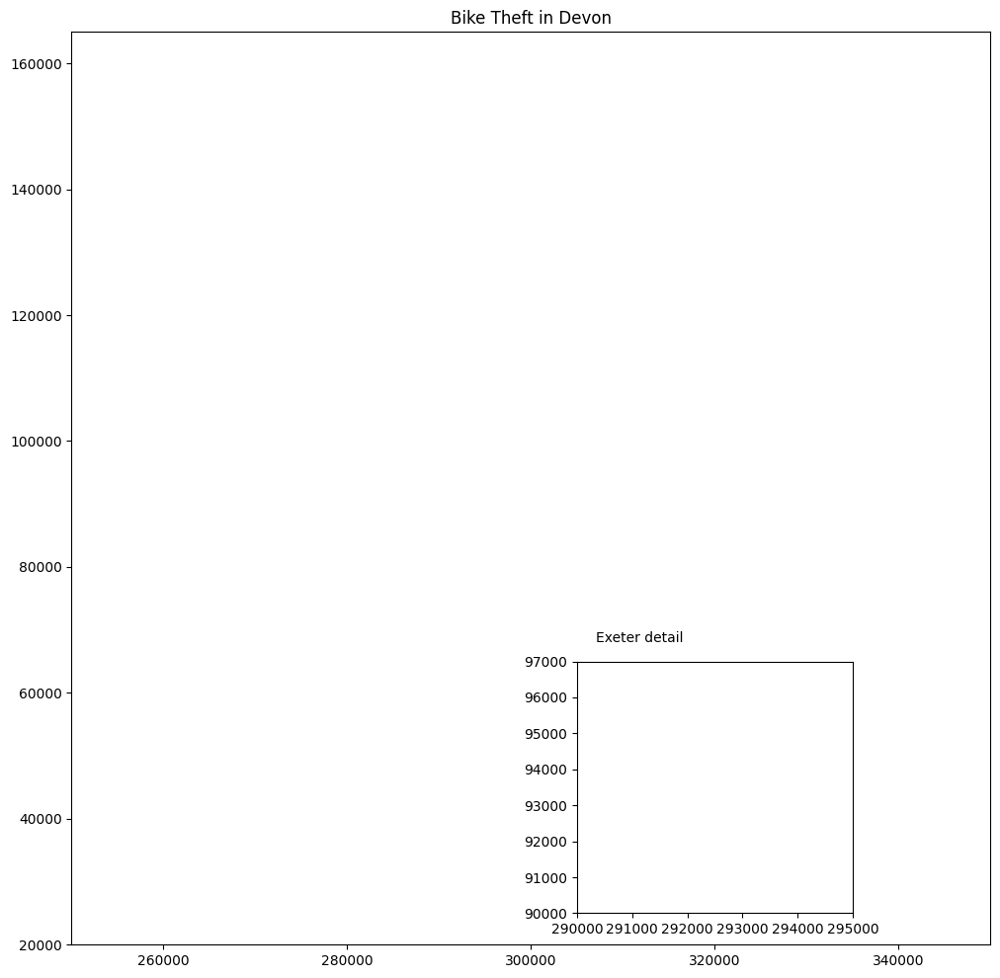

In [45]:
fig, ax1 = plt.subplots(figsize=(12,12))

ax1.set_xlim(250000, 350000)
ax1.set_ylim(20000, 165000)

ax2 = ax1.inset_axes([305000,25000,30000,40000],
                     transform=ax1.transData,
                     xlim=(290000,295000),
                     ylim=(90000,97000)
                     )

ax1.text(307000,68000,'Exeter detail', fontsize='medium')

plt.title("Bike Theft in Devon")

In [46]:
# ax2.indicate_inset_zoom(ax2, edgecolor="black", ls='--', ec='black', fc=None)

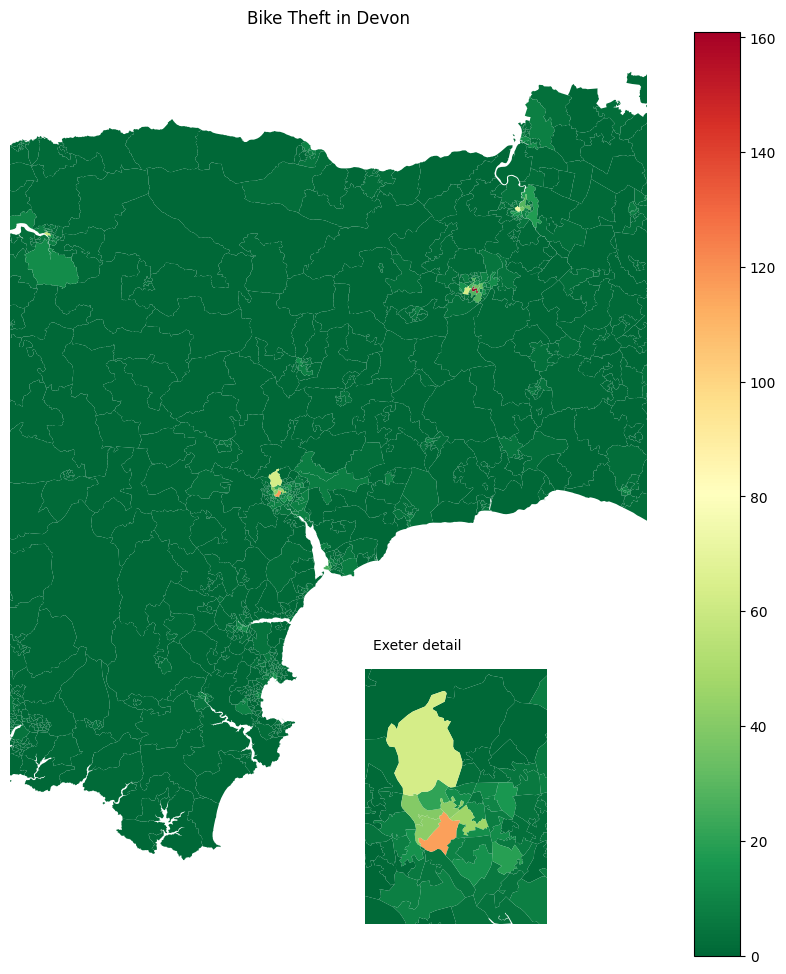

In [47]:
fig, ax1 = plt.subplots(figsize=(12,12))

lsoa_2011_crime_figures_df_devon=lsoa_2011_crime_figures_df.cx[250000:350000, 0:150000]

ax1 = lsoa_2011_crime_figures_df_devon.plot(
    column='sw_5forces_street_by_lsoa_Bicycle theft',
    cmap="RdYlGn_r",
    legend=True,
    ax=ax1
    )

ax1.set_xlim(250000, 350000)
ax1.set_ylim(20000, 165000)

ax2 = ax1.inset_axes([305000,25000,30000,40000],
                     transform=ax1.transData,
                     xlim=(290000,295000),
                     ylim=(90000,97000)
                     )

ax2 = lsoa_2011_crime_figures_df_devon.plot(
    column='sw_5forces_street_by_lsoa_Bicycle theft',
    cmap="RdYlGn_r",
    legend=False,
    ax=ax2
    )

ax1.text(307000,68000,'Exeter detail', fontsize='medium')
ax1.axis('off')
ax2.axis('off')

plt.title("Bike Theft in Devon")

plt.savefig("bike_theft_plot.jpg")

# Leaflet Folium

In [49]:
# create the map object
bike_crime_map_interactive = folium.Map(
    location=[50.71671, -3.50668],
    zoom_start=9,
    tiles='cartodbpositron'
    )

bike_crime_map_interactive

In [54]:
lsoa_2011_crime_figures_df_devon.explore()


In [55]:
#create base map
bike_crime_map_interactive = folium.Map(
    location=[50.71671, -3.50668],
    zoom_start=9,
    tiles='cartodbpositron'
    )

# create and add choropleth map
choropleth = folium.Choropleth(
    geo_data=lsoa_2011_crime_figures_df_devon,
    data=lsoa_2011_crime_figures_df_devon,
    columns=['LSOA11NM', 'sw_5forces_street_by_lsoa_Bicycle theft'], # [key, field to plot]
    key_on='feature.properties.LSOA11NM',
    fill_color='OrRd',
    fill_opacity=0.4,
    line_weight=0.3,
    legend_name='Bicycle Thefts',
    highlight=True, # highlight the LSOA shape when mouse pointer enters it
    smooth_factor=0
    )

choropleth.add_to(bike_crime_map_interactive)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        ['LSOA11NM', 'sw_5forces_street_by_lsoa_Bicycle theft'],
        labels=True
        )
)

bike_crime_map_interactive.save("bike_crime_map_interactive.html")

In [56]:
#create base map
bike_crime_map_interactive = folium.Map(
    location=[50.71671, -3.50668],
    zoom_start=9,
    tiles='cartodbpositron'
    )

# create and add choropleth map
choropleth = folium.Choropleth(
    geo_data=lsoa_2011_crime_figures_df_devon, # pass in the dataframe that contains geometry
    data=lsoa_2011_crime_figures_df_devon, # set the data df - this can be a normal pandas dataframe!
    columns=['LSOA11NM', 'sw_5forces_street_by_lsoa_Bicycle theft'], # [key, field to plot]
    key_on='feature.properties.LSOA11NM', # Pass in the field that links the two dataframes
    # Note that this ^^ is (necessary even if they're the same dataframe!)
    fill_color='OrRd', # Set an orange-red colourmap
    fill_opacity=0.4, # Make the choropleth layer transparent
    line_weight=0.3, # Make the edges of each choropleth thinner
    legend_name='Bicycle Thefts', # Set the tile of the legend
    highlight=True, # highlight the LSOA shape when mouse pointer enters it
    smooth_factor=0 # Prevent the edges of the LSOA boundaries from being simplified
    )

choropleth.add_to(bike_crime_map_interactive)  # Add it to our basemap

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        ['LSOA11NM',
        'sw_5forces_street_by_lsoa_Bicycle theft',
        'sw_5forces_street_by_lsoa_Total number crimes'],
        labels=True
        )
)

bike_crime_map_interactive

In [57]:
bike_crime_map_interactive.save("bike_crime_map_interactive.html")

In [58]:
lsoa_2011_crime_figures_df_devon

,LSOA11CD,LSOA11NM,LSOA11NMW,Area,sw_5forces_street_by_lsoa_Anti-social behaviour,sw_5forces_street_by_lsoa_Bicycle theft,sw_5forces_street_by_lsoa_Burglary,sw_5forces_street_by_lsoa_Criminal damage and arson,sw_5forces_street_by_lsoa_Drugs,sw_5forces_street_by_lsoa_Other crime,sw_5forces_street_by_lsoa_Other theft,sw_5forces_street_by_lsoa_Possession of weapons,sw_5forces_street_by_lsoa_Public order,sw_5forces_street_by_lsoa_Robbery,sw_5forces_street_by_lsoa_Shoplifting,sw_5forces_street_by_lsoa_Theft from the person,sw_5forces_street_by_lsoa_Vehicle crime,sw_5forces_street_by_lsoa_Violence and sexual offences,sw_5forces_street_by_lsoa_Total number crimes,geometry
639,E01015035,Plymouth 012A,Plymouth 012A,293516,97,0,13,30,4,5,34,1,10,1,28,0,16,53,292,"MULTIPOLYGON (((250286.812 57023.336, 250068.7..."
641,E01015037,Plymouth 012B,Plymouth 012B,210440,62,0,1,33,3,5,6,0,6,0,0,0,25,70,211,"MULTIPOLYGON (((249939.469 56846.059, 250068.8..."
659,E01015055,Plymouth 021A,Plymouth 021A,685156,179,2,12,51,15,13,58,5,33,0,78,3,16,151,616,"MULTIPOLYGON (((251493.075 56834.236, 251850.9..."
660,E01015056,Plymouth 021B,Plymouth 021B,392298,74,0,15,53,12,6,12,3,18,1,0,0,10,124,328,"MULTIPOLYGON (((250474.772 56596.636, 250459.8..."
661,E01015057,Plymouth 021C,Plymouth 021C,218701,459,4,18,122,17,12,38,3,57,1,11,4,42,314,1102,"MULTIPOLYGON (((250110.000 56480.000, 250138.1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3241,E01033232,Exeter 011F,Exeter 011F,271109,102,10,5,46,5,5,20,0,15,0,0,0,6,105,319,"MULTIPOLYGON (((295585.000 91850.000, 295575.9..."
3242,E01033233,Exeter 001F,Exeter 001F,3599088,104,63,39,43,50,7,119,2,25,4,19,7,15,144,641,"MULTIPOLYGON (((292161.094 95643.602, 292177.1..."
3243,E01033234,Exeter 011G,Exeter 011G,2178701,304,8,38,124,28,18,198,3,40,2,87,8,75,237,1170,"MULTIPOLYGON (((296557.406 91326.500, 296341.9..."
3244,E01033235,Exeter 015E,Exeter 015E,269422,46,4,12,20,1,6,12,0,3,0,15,0,6,43,168,"MULTIPOLYGON (((296244.760 87971.419, 296217.9..."


In [59]:
gp_list = pd.read_csv("gp_surgery_locations_plus_patient_list_size.csv")

gp_list_gdf = geopandas.GeoDataFrame(
    gp_list, # Our pandas dataframe
    geometry = geopandas.points_from_xy(
        gp_list['result_longitude'], # Our 'x' column (horizontal position of points)
        gp_list['result_latitude'] # Our 'y' column (vertical position of points)
        ),
    crs = "EPSG:4326"
    )

In [60]:
gp_list_gdf.geometry

0        POINT (-1.31899 54.56162)
1        POINT (-1.31388 54.56916)
2        POINT (-1.26214 54.53820)
3        POINT (-1.05544 54.53260)
4        POINT (-1.31359 54.56862)
                   ...            
12463     POINT (0.09731 51.37480)
12464    POINT (-2.62909 53.55774)
12465    POINT (-0.76565 51.25436)
12466    POINT (-2.62909 53.55774)
12467    POINT (-1.10302 52.67650)
Name: geometry, Length: 12468, dtype: geometry

In [61]:
gp_list_gdf_sw

,Unnamed: 0,gp_code,name,address_1,postcode,valid_from,valid_to,query,result_postcode,result_quality,...,Male 00-04,Male 05-14,Male 15-24,Male 25-34,Male 35-44,Male 45-54,Male 55-64,Male 65-74,Male 75+,geometry
416,416,A91056,RALEIGH MEDICAL CENTRE,RALEIGH MEDICAL CENTRE,PL11 2PD,20101001,NaN,PL11 2PD,PL11 2PD,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (241883.000 55004.000)
417,417,A91057,SEAHAWK MEDICAL CENTRE,SEAHAWK MEDICAL CENTRE,TR12 7RH,20101001,NaN,TR12 7RH,TR12 7RH,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (167165.000 25483.000)
418,418,A91058,ST MAWGAN MEDICAL CENTRE,ST MAWGAN MEDICAL CENTRE,TR8 4HP,20101001,NaN,TR8 4HP,TR8 4HP,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (187071.000 64281.000)
419,419,A91060,CHIVENOR MEDICAL CENTRE,CHIVENOR MEDICAL CENTRE,EX31 4AZ,20101001,NaN,EX31 4AZ,EX31 4AZ,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (250143.000 134819.000)
420,420,A91061,LYMPSTONE MEDICAL CENTRE,LYMPSTONE MEDICAL CENTRE,EX8 5AR,20101001,NaN,EX8 5AR,EX8 5AR,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (298682.000 85930.000)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12349,12349,Y08023,PERINATAL MH NMPS,CAREW HOUSE,PL31 2QN,20230808,NaN,PL31 2QN,PL31 2QN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (205607.000 67139.000)
12399,12399,Y08073,RESPIRATORY,CAREW HOUSE,PL31 2QN,20230825,NaN,PL31 2QN,PL31 2QN,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (205607.000 67139.000)
12430,12430,Y08104,MENDIP INTERGRATED HUB,WEST MENDIP PCN,BA16 0ET,20231001,NaN,BA16 0ET,BA16 0ET,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (348461.000 136582.000)
12459,12459,Y08133,BRISTOL COMMUNITY EMERGENCY MEDICINE,SW AMBULANCE SERVICE NHS,EX2 7HY,20231101,NaN,EX2 7HY,EX2 7HY,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (296698.000 92195.000)


In [62]:
xmin, xmax = -6.449974,-2.717735
ymin, ymax =  49.814737,51.246969
gp_list_gdf_sw = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

gp_map_interactive = folium.Map(
    location=[50.7, -4.2],
    zoom_start=8,
    tiles='openstreetmap',
    )

# Filter out instances with no geometry
gp_list_gdf_sw = gp_list_gdf_sw[~gp_list_gdf_sw['geometry'].is_empty]

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in gp_list_gdf_sw.geometry]

for coordinates in geo_df_list:
     gp_map_interactive.add_child(
        folium.Marker(
            location=coordinates
            )
     )

gp_map_interactive

In [63]:
xmin, xmax = -6.449974,-2.717735
ymin, ymax =  49.814737,51.246969
gp_list_gdf_sw = gp_list_gdf.cx[xmin:xmax, ymin:ymax]

gp_map_interactive = folium.Map(
    location=[50.7, -4.2],
    zoom_start=8,
    tiles='openstreetmap',
    )

# Filter out instances with no geometry
gp_list_gdf_sw = gp_list_gdf_sw[~gp_list_gdf_sw['geometry'].is_empty]

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in gp_list_gdf_sw.geometry]

for coordinates in geo_df_list:
     gp_map_interactive.add_child(
        folium.Marker(
            location=coordinates,
            icon=folium.Icon(icon="user-md", prefix='fa', color="black")
            )
     )

gp_map_interactive

In [64]:
xmin, xmax = -6.449974,-2.717735
ymin, ymax =  49.814737,51.246969
gp_list_gdf_sw = gp_list_gdf.cx[xmin:xmax, ymin:ymax].reset_index(drop=True)

gp_map_interactive = folium.Map(
    location=[50.7, -4.2],
    zoom_start=8,
    tiles='openstreetmap',
    )

# Filter out instances with no geometry
gp_list_gdf_sw = gp_list_gdf_sw[~gp_list_gdf_sw['geometry'].is_empty]

# Create a geometry list from the GeoDataFrame
geo_df_list = [[point.xy[1][0], point.xy[0][0]] for point in gp_list_gdf_sw.geometry]

for i, coordinates in enumerate(geo_df_list):

    gp_map_interactive.add_child(
        folium.Marker(
            location=coordinates,
            tooltip=f"{gp_list_gdf_sw['name'][i].title()}<br>List Size: {gp_list_gdf_sw['Total List Size'][i]}"
            )
     )

gp_map_interactive

In [89]:
from folium import plugins

gp_map_interactive = folium.Map(
    location=[50.7, -4.2],
    zoom_start=8,
    tiles='openstreetmap',
    )

heat_data = [[point.y, point.x] for point in gp_list_gdf.geometry if not point.is_empty]

heatmap_layer = plugins.HeatMap(
    heat_data,
    radius=15,
    blur=5)

heatmap_layer.add_to(gp_map_interactive)

gp_map_interactive

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=6c661ea7-9b58-4649-92ed-c2a834b4f69c' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>